# **Image Quilting for Texture Synthesis and Transfer**

by,


> Ahire Durgesh Anand (18D070004)

> Priyanka Sandeep Bagade (18D070021)

> Shreshtha Singh (18D070029)








# ***Texture Synthesis (Quilting)***

In [ ]:
#Importing Required Libraries
import numpy as np
import math
from skimage import io, util
import heapq
import random
from matplotlib import pyplot as plt
import math
from skimage.color import rgb2gray
from skimage.filters import gaussian

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Function for creating a texture based on random sampled patches from the input image 
def random_patch(texture, patch_len): 
    
    h, w, d = np.shape(texture)
    l = random.randint(0, h - patch_len - 1)
    m = random.randint(0, w - patch_len - 1)

    return texture[l:l+patch_len, m:m+patch_len]

In [ ]:
# this function  calculates the squared error of overlapping area of patches  
def OverlapDiff(patch, patch_len, overlap, new_texture, y, x):
    e = 0

    if x > 0:
        left_overlap = patch[:, :overlap] - new_texture[y:y+patch_len, x:x+overlap]
        e = e + np.sum(np.square(left_overlap))

    elif y > 0:
        up_overlap   = patch[:overlap, :] - new_texture[y:y+overlap, x:x+patch_len]
        e = e + np.sum(np.square(up_overlap))

    elif x > 0 and y > 0:
        corner_overlap = patch[:overlap, :overlap] - new_texture[y:y+overlap, x:x+overlap]
        e = e- np.sum(np.square(corner_overlap))

    return e

In [ ]:
#Function for creating a texture based on random sampled patches which minimize 
# the overlapping error with new texture that is being generated
def BestPatch(texture, patch_len, overlap, new_texture, y, x): 
    
    h, w, _ = texture.shape
    errors = np.ones((h - patch_len, w - patch_len))

    #iterating over all patches in order to find the patch that minimizes the error with new texture being generated 
    
    for i in range(0,h - patch_len):
        for j in range(0,w - patch_len):
            patch = texture[i:i+patch_len, j:j+patch_len]
            
            e = 0

            if x > 0: #Left side overlap error
                left_overlap = patch[:, :overlap] - new_texture[y:y+patch_len, x:x+overlap]
                e = e + np.sum(np.square(left_overlap))

            if y > 0: #Top side overlap error
                up_overlap   = patch[:overlap, :] - new_texture[y:y+overlap, x:x+patch_len]
                e = e + np.sum(np.square(up_overlap))

            if x > 0 and y > 0: #corner overlap error
                corner_overlap = patch[:overlap, :overlap] - new_texture[y:y+overlap, x:x+overlap]
                e = e- np.sum(np.square(corner_overlap)) #substracted from total error since the corner error

            errors[i][j] = e

    i_min, j_min = np.unravel_index(np.argmin(errors), errors.shape)
    return texture[i_min:i_min+patch_len, j_min:j_min+patch_len]

In [ ]:
#Dijkstra's algorithm has been applied to find the smallest sum of error 
#  in the overlapping region of the patch
def shortCutPath(errors):
    # dijkstra's algorithm vertical
    pq = [(error, [i]) for i, error in enumerate(errors[0])]
    heapq.heapify(pq)

    h, w = errors.shape
    seen = set()

    while pq:
        error, path = heapq.heappop(pq)
        curDepth = len(path)
        curIndex = path[-1]

        if curDepth == h:
            return path

        for delta in -1, 0, 1:
            nextIndex = curIndex + delta

            if 0 <= nextIndex < w:
                if (curDepth, nextIndex) not in seen:
                    cumError = error + errors[curDepth, nextIndex]
                    heapq.heappush(pq, (cumError, path + [nextIndex]))
                    seen.add((curDepth, nextIndex))


In [ ]:
def shortCutPatch(patch, patch_len, overlap, new_texture, y, x):
    patch = patch.copy()
    del_y, del_x, dz = patch.shape
    minCut = np.zeros_like(patch, dtype=bool)

    if x > 0:
        left = patch[:, :overlap] - new_texture[y:y+del_y, x:x+overlap]
        leftL2 = np.sum(np.square(left), axis=2)
        for i, j in enumerate(shortCutPath(leftL2)):
            minCut[i, :j] = True

    if y > 0:
        up = patch[:overlap, :] - new_texture[y:y+overlap, x:x+del_x]
        upL2 = np.sum(np.square(up), axis=2)
        for j, i in enumerate(shortCutPath(upL2.T)):
            minCut[:i, j] = True

    np.copyto(patch, new_texture[y:y+del_y, x:x+del_x], where=minCut)

    return patch

In [ ]:
def texture_synthesis(texture, patch_len, numPatches, type="cut", sequence=False):

    texture = util.img_as_float(texture)

    overlap = patch_len // 6 # No of Overlapping Pixels 
    num_vertical_patches, num_horizontal_patches = numPatches # No of image patches in y-direction and x-direction respectively

    #Calculating the height and the width of the image
    h = (num_vertical_patches * patch_len) - (num_vertical_patches - 1) * overlap
    w = (num_horizontal_patches * patch_len) - (num_horizontal_patches - 1) * overlap
    d = texture.shape[2]
    
    new_texture = np.zeros((h, w, d)) # Container for storing the modified image

    #iterating over the patches to create the texture depending upon the type input
    
    for i in range(num_vertical_patches):
        for j in range(num_horizontal_patches):
          
            uncommon_area = (patch_len - overlap)
            y = i * uncommon_area
            x = j * uncommon_area

            if i == 0 and j == 0 :
                patch = random_patch(texture, patch_len)
            
            elif type == "random":
                patch = random_patch(texture, patch_len)

            elif type == "best":
                patch = BestPatch(texture, patch_len, overlap, new_texture, y, x)
            
            elif type == "cut":
                patch = BestPatch(texture, patch_len, overlap, new_texture, y, x)
                patch = shortCutPatch(patch, patch_len, overlap, new_texture, y, x)
            
            new_texture[y:y+patch_len, x:x+patch_len] = patch

            if sequence:
                io.imshow(new_texture)
                io.show()
      
    return new_texture

In [ ]:
# This function plots original images and different types of quilted images together
def display_images(texture):
  # create figure
  fig = plt.figure(figsize=(20,20))
  # setting values to rows and column variables
  rows = 1
  columns = 4
  # Adds a subplot at the 1st position
  fig.add_subplot(rows, columns, 1)
  #Original Image
  plt.imshow(texture)
  plt.title("Original Image")
  #Random quilted Image
  # Adds a subplot at the 2nd position
  fig.add_subplot(rows, columns, 2)
  plt.imshow(texture_synthesis(texture, 25, (10,10), "random"))
  plt.title("Random quilted Image")
  # Best Patch quilted Image
  # Adds a subplot at the 3rd position
  fig.add_subplot(rows, columns, 3)
  plt.imshow(texture_synthesis(texture, 25, (10, 10), "best"))
  plt.title("Best Patch quilted Image")
  # Adds a subplot at the 4th position
  fig.add_subplot(rows, columns, 4)
  #Min Error Boundary Quilted Image
  plt.imshow(texture_synthesis(texture, 25, (10, 10), "cut"))
  plt.title("Min Error Boundary Quilted Image")

##**Results**

In [ ]:
input_path = "/content/drive/MyDrive/inputs/synthesis/"

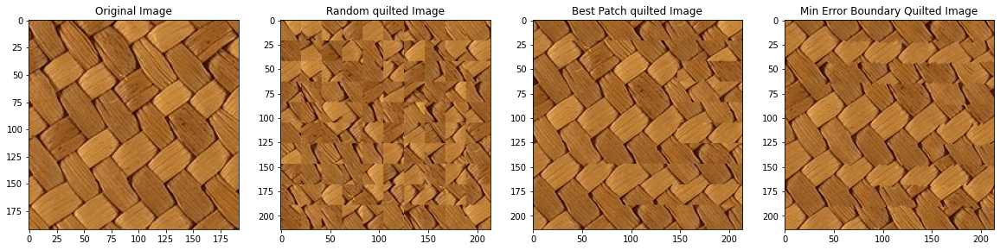

In [ ]:
input_path = "/content/drive/MyDrive/inputs/synthesis/"
texture = io.imread(input_path + "mat.png")
display_images(texture)

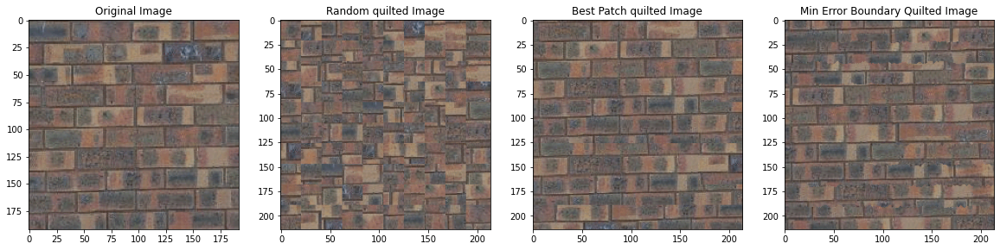

In [ ]:
texture = io.imread(input_path + "bricks.png")
display_images(texture)

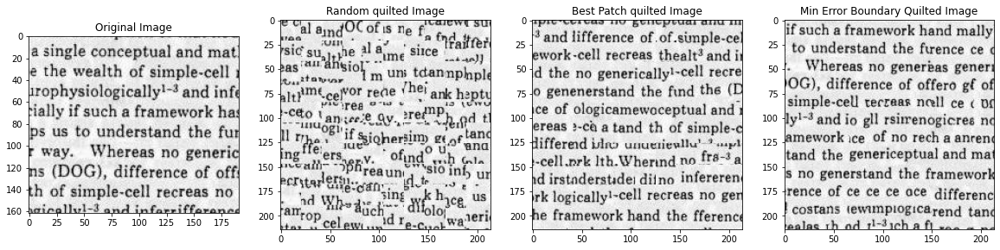

In [ ]:
texture = io.imread(input_path + "text.png")
display_images(texture)

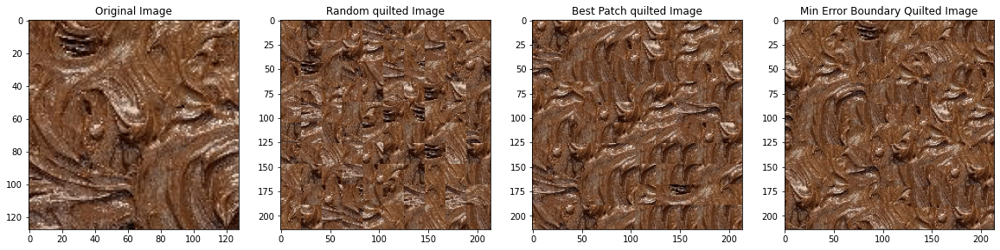

In [ ]:
texture = io.imread(input_path + "chocolate.png")
display_images(texture)

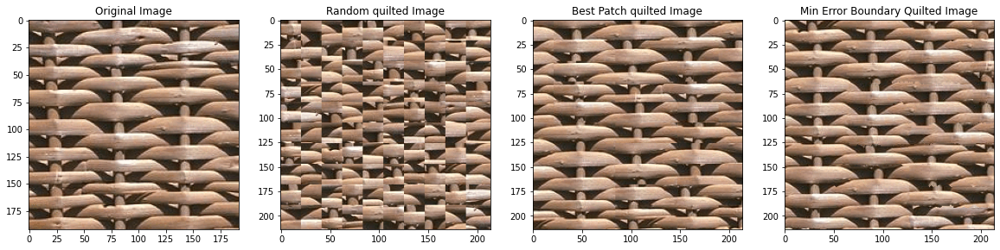

In [ ]:
texture = io.imread(input_path + "jute.png")
display_images(texture)

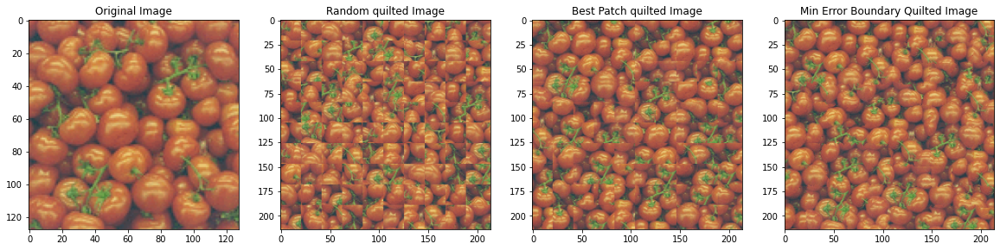

In [ ]:
texture = io.imread(input_path + "tomatoes.png")
display_images(texture)

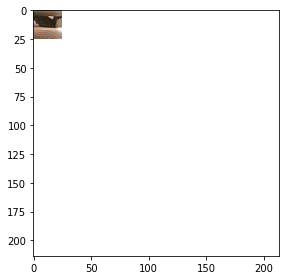

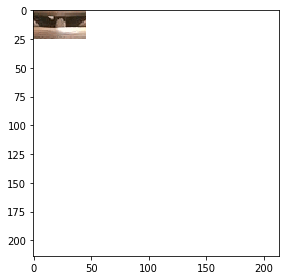

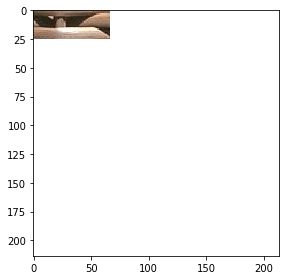

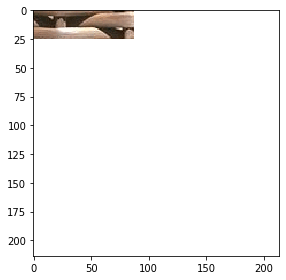

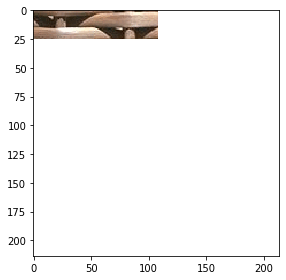

...

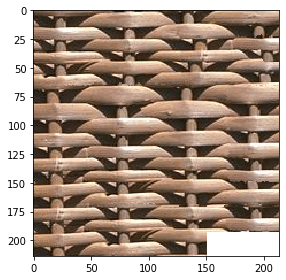

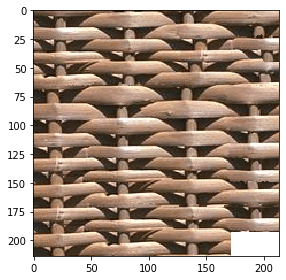

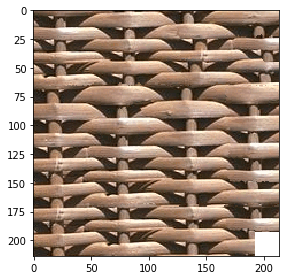

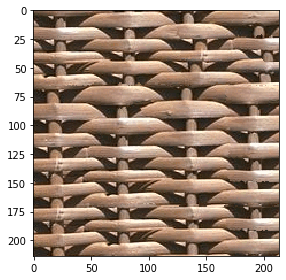

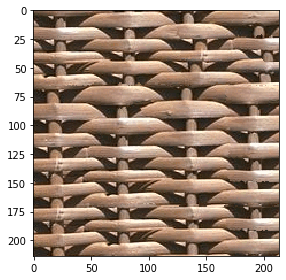

In [ ]:
io.imshow(texture_synthesis(texture, 25, (10, 10), "cut", True))
io.show()

# ***Texture Transfer***

In [ ]:
# this function finds the patch of texture image with lowest correspondence error with the target image patch
def bestPatchCorr(texture, corrTexture, patch_len, corrTarget, y, x):
    h, w, d = texture.shape
    errors = np.zeros((h - patch_len, w - patch_len))

    corrTargetPatch = corrTarget[y:y+patch_len, x:x+patch_len]
    PatchHeight, PatchWidth = np.shape(corrTargetPatch)

    #looping over texture patches to find lowest correspondence error patch
    for i in range(h - patch_len):
        for j in range(w - patch_len):
            corrTexturePatch = corrTexture[i:i+PatchHeight, j:j+PatchWidth]
            e = corrTexturePatch - corrTargetPatch
            errors[i][j] = np.sum(np.square(e))

    # gives argument corresponding to minimum error patch 
    i_min, j_min = np.unravel_index(np.argmin(errors), errors.shape)
    return texture[i_min:i_min+PatchHeight, j_min:j_min+PatchWidth]

In [ ]:
# This function finds modified  the weighted error term of the image quilting algorithm 
# alpha times the block overlap matching error added to (1 - alpha) times 
# the squared error between the correspondence map pixels within the source texture block and
# those at the current target image position
def bestOverlapPatchCorr(texture, corrTexture, patch_len, overlap, 
                         corrTarget, new_texture, y, x, alpha=0.1, level=0):
    h, w, d = texture.shape
    errors = np.zeros((h - patch_len, w - patch_len))

    corrTargetPatch = corrTarget[y:y+patch_len, x:x+patch_len]
    del_i, del_j = np.shape(corrTargetPatch)

    for i in range(h - patch_len):
        for j in range(w - patch_len):
            patch = texture[i:i+del_i, j:j+del_j]
            e = 0

            if x > 0:
                left_overlap = patch[:, :overlap] - new_texture[y:y+patch_len, x:x+overlap]
                e += np.sum(left_overlap**2)

            if y > 0:
                up_overlap   = patch[:overlap, :] - new_texture[y:y+overlap, x:x+patch_len]
                e += np.sum(up_overlap**2)

            if x > 0 and y > 0:
                corner_overlap = patch[:overlap, :overlap] - new_texture[y:y+overlap, x:x+overlap]
                e -= np.sum(corner_overlap**2)
            overlapError = e

            corrTexturePatch = corrTexture[i:i+del_i, j:j+del_j]
            corrError = np.sum((corrTexturePatch - corrTargetPatch)**2)

            prevError = 0
            if level > 0:
                prevError = patch[overlap:, overlap:] - new_texture[y+overlap:y+patch_len, x+overlap:x+patch_len]
                prevError = np.sum(prevError**2)
            
            errors[i, j] = alpha * (overlapError + prevError) + (1 - alpha) * corrError

    # gives argument corresponding to minimum weighted error patch 
    i_min, j_min = np.unravel_index(np.argmin(errors), errors.shape)
    return texture[i_min:i_min+del_i, j_min:j_min+del_j]

In [ ]:
# given the type of transfer as input i.e best, overlap or cut this function
# evaluates the images just by minimising correspondence error , by minimising weighted error 
# or by also including the mininimum error boundary cut.
def Texturetransfer(texture, target, patch_len, type="cut", 
             alpha=0.1, level=0, prior=None):
    corrTexture = rgb2gray(texture)
    corrTarget  = rgb2gray(target)

    io.imshow(corrTexture)
    io.show()
    io.imshow(corrTarget)
    io.show()

    # remove alpha channel
    texture = util.img_as_float(texture)[:,:,:3]
    target = util.img_as_float(target)[:,:,:3]

    h, w, _ = target.shape
    overlap = patch_len // 6

    num_vertical_patches  = math.ceil((h - patch_len) / (patch_len - overlap)) + 1 or 1
    num_horizontal_patches = math.ceil((w - patch_len) / (patch_len - overlap)) + 1 or 1
    
    if level == 0:
        new_texture = np.zeros_like(target)
    else:
        new_texture = prior

    for i in range(num_vertical_patches):
        for j in range(num_horizontal_patches):
            unused_area = (patch_len - overlap)
            y = i * unused_area
            x = j * unused_area

            if i == 0 and j == 0 or type == "best":
                patch = bestPatchCorr(texture, corrTexture, patch_len, corrTarget, y, x)
            elif type == "overlap":
                patch = bestOverlapPatchCorr(texture, corrTexture, patch_len, 
                                             overlap, corrTarget, new_texture, y, x)
            elif type == "cut":
                patch = bestOverlapPatchCorr(texture, corrTexture, patch_len, 
                                             overlap, corrTarget, new_texture, y, x, 
                                             alpha, level)
                patch = shortCutPatch(patch, patch_len, overlap, new_texture, y, x)
            
            new_texture[y:y+patch_len, x:x+patch_len] = patch
      
    return new_texture

In [ ]:
# This function iterates over the Texturetransfer function giving the most recent
# obtained transfered texture as prior and changing alpha with every iteration
def transferIter(texture, target, patch_len, n):
    new_texture = Texturetransfer(texture, target, patch_len)
    for i in range(1, n):
        alpha = 0.1 + 0.8 * i / (n - 1)
        patch_len = patch_len * 2**i // 3**i
        new_texture = Texturetransfer(texture, target, patch_len, 
                       alpha=alpha, level=i, prior=new_texture)
    
    return new_texture


(281, 231, 3)


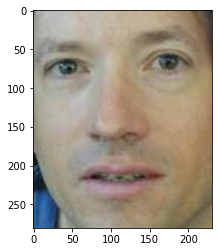

(133, 197, 3)


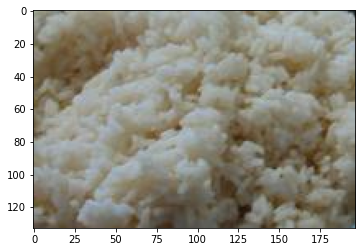

In [ ]:
input_path = "/content/drive/MyDrive/inputs/transfer/"
bill = io.imread(input_path + "bill.png")
rice = io.imread(input_path + "rice.png")


print(bill.shape)
plt.imshow(bill)
plt.show()

print(rice.shape)
plt.imshow(rice)
plt.show()

In [ ]:
## Loss function
def Loss_function(original, syn):
  height, width, depth = original.shape
  for i in range(height):
      loss3 += np.sqrt(np.sum(np.square(original[i][:,0:3]/np.max(original) - syn[i]/np.max(syn))))

## **Results**


#Example1

In [ ]:
# showing results for single iteration
%time res2 = transferIter(rice, bill, 20, 1)
io.imshow(res2)
io.show()

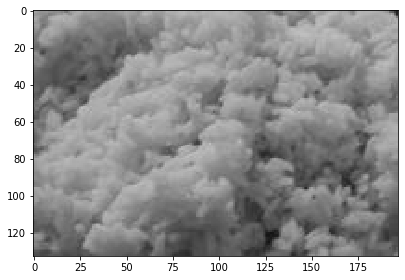

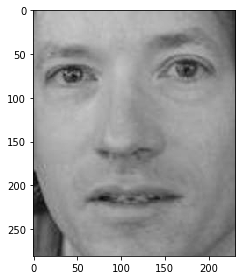

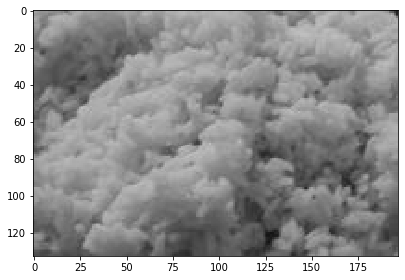

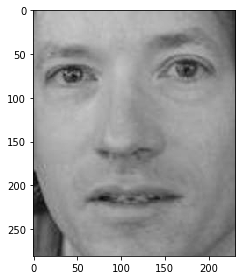

CPU times: user 13min 32s, sys: 1.97 s, total: 13min 34s
Wall time: 13min 35s


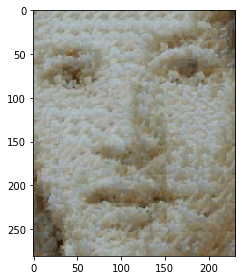

In [ ]:
%time res2 = transferIter(rice, bill, 20, 2)
io.imshow(res2)
io.show()

#Example2

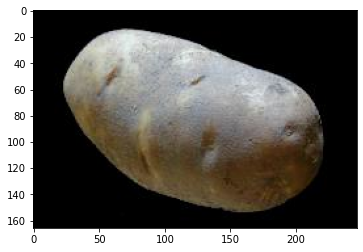

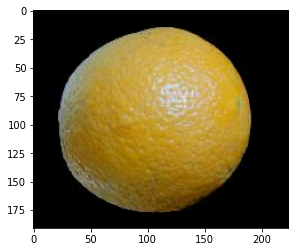

In [ ]:
orange = io.imread(input_path + "orange.png")
potato = io.imread(input_path + "potato.png")


plt.imshow(potato)
plt.show()

plt.imshow(orange)
plt.show()

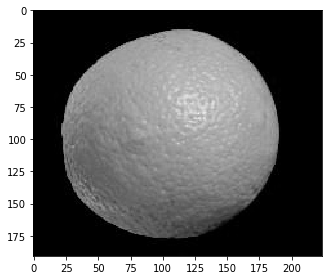

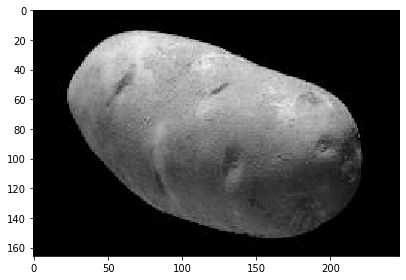

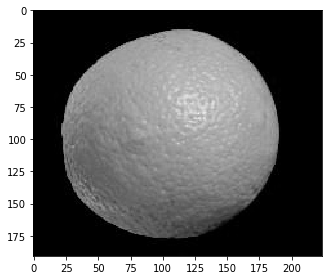

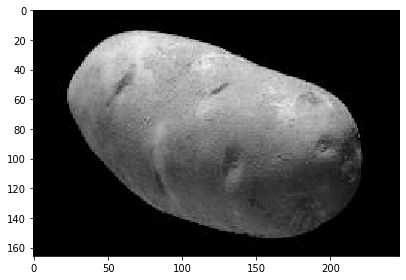

CPU times: user 14min 22s, sys: 2.14 s, total: 14min 24s
Wall time: 14min 25s


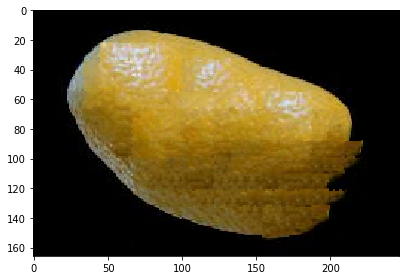

In [ ]:
%time res2 = transferIter(orange, potato, 20, 2)
io.imshow(res2)
io.show()

#Example3

In [ ]:
s = "https://people.eecs.berkeley.edu/~efros/research/quilting/figs/transfer/"
girl = io.imread(s + "girl.jpg")
fiber = io.imread(s + "fabric.jpg")

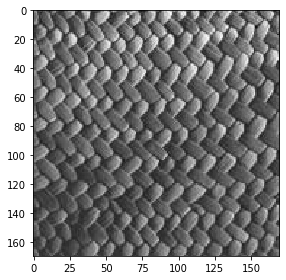

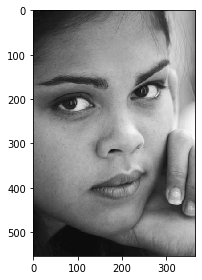

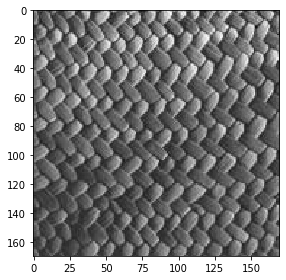

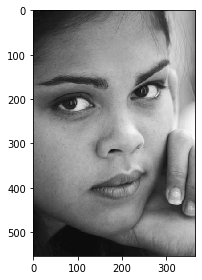

CPU times: user 48min 9s, sys: 5.96 s, total: 48min 15s
Wall time: 48min 20s


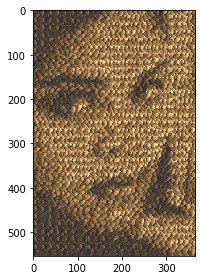

In [ ]:
%time transfer3 = transferIter(fiber, girl, 20, 2)
io.imshow(transfer3)
io.show()

# **References**

1. Dataset


> https://people.eecs.berkeley.edu/~efros/research/quilting/figs/transfer/



2. Dijkstra's algorithm using **heapq**


> https://gist.github.com/kachayev/5990802







3. Image Quilting for texture transfer



> https://github.com/rohitrango/Image-Quilting-for-Texture-Synthesis



